In [17]:
import torch
import torch.nn as nn
import pickle
import numpy as np
import torchvision
from torchvision.models import vgg11, ResNet50_Weights, resnet50
import matplotlib.pyplot as plt
from torch.utils.flop_counter import FlopCounterMode
from typing import Union, Tuple
import os
from mpl_toolkits import axes_grid1
from collections import defaultdict
import re
import glob

In [18]:
def is_cnn_layer(module):
    # Check if the module has no children
    has_no_children = len(list(module.children())) == 0

    # Only use convolutional layers to determine when to freeze
    is_target_type = isinstance(module, (nn.Conv2d))

    return has_no_children and is_target_type

In [36]:
dataset = "cifar100"
model_name = "vgg11"
num_epochs = 200
name_of_experiment = "mambafrz_vgg11_data_generation_12_seeds"
name_of_location_for_training_data = "mambafrz_vgg11_data_generation_12_seeds/training_data_more_data_times_three"
device = "cuda:0"
number_of_cnn_layers = 8
max_num_of_cnn_layers = number_of_cnn_layers - 1

In [20]:
layer_names = []
all_cnn_layer_names = []

if dataset == "cifar10":
    num_classes = 10
elif dataset == "cifar100":
    num_classes = 100
elif dataset == "imagenet":
    num_classes = 1000

if model_name == "resnet50":
    model = resnet50(weights=None)
    model.conv1 = nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1, bias=False)
    # Adjust the maxpool layer (since CIFAR-100 is small)
    model.maxpool = nn.Identity()  # Remove max pooling
    # Modify the last fully connected layer for CIFAR-100
    num_features = model.fc.in_features
    model.fc = nn.Linear(num_features, num_classes)
elif model_name == "vgg11":
    model = vgg11(weights=None)
    num_features = model.classifier[6].in_features
    model.classifier[6] = nn.Linear(num_features, num_classes)
    
counter_for_cnn_layers = number_of_cnn_layers
sampled_indices = np.linspace(0, max_num_of_cnn_layers, counter_for_cnn_layers).astype(int)
print(f"Sampled indices: {sampled_indices}")
current_index_for_indices = 0
index_counter_for_cnn_layers = 0
  
for name, module in model.named_modules():
    if counter_for_cnn_layers == 0:
        break
    if is_cnn_layer(module):
        all_cnn_layer_names.append(name)
        if index_counter_for_cnn_layers == sampled_indices[current_index_for_indices]:
            layer_names.append(name)
            counter_for_cnn_layers -= 1
            current_index_for_indices += 1
        
        # Always increment index counter
        index_counter_for_cnn_layers += 1
print(f"Length of all CNN layer names: {len(all_cnn_layer_names)}")
print(f"Length of evenly sampled CNN layer names: {len(layer_names)}")

Sampled indices: [0 1 2 3 4 5 6 7]
Length of all CNN layer names: 8
Length of evenly sampled CNN layer names: 8


In [21]:
layer_names

['features.0',
 'features.3',
 'features.6',
 'features.8',
 'features.11',
 'features.13',
 'features.16',
 'features.18']

In [22]:
# Get a list of all the seeds from which data was generated
seed_directories = [folder_name for folder_name in os.listdir(name_of_experiment) if "seed" in folder_name]

In [23]:
print(f"Number of seeds generated: {len(seed_directories)}")

Number of seeds generated: 44


## (1) Look At CKA Plots from Different Seeds

In [24]:
# First look at CKA values across epochs heatmap
def add_colorbar(im, aspect=5, pad_fraction=10, **kwargs):
    """Add a vertical color bar to an image plot."""
    divider = axes_grid1.make_axes_locatable(im.axes)
    width = axes_grid1.axes_size.AxesY(im.axes, aspect=1./aspect)
    print("Width", width)
    pad = axes_grid1.axes_size.Fraction(pad_fraction, width)
    print("Pad", pad)
    current_ax = plt.gca()
    cax = divider.append_axes("right", size=width, pad=pad)
    plt.sca(current_ax)
    return im.axes.figure.colorbar(im, cax=cax, **kwargs)

def make_square_axes(ax):
    """Make an axes square in screen units.

    Should be called after plotting.
    """
    ax.set_aspect(1 / ax.get_data_ratio())

def plot_results(
          cka_mini_batch_vector,
          save_path: str = None,
          title: str = None
          ):
        fig, ax = plt.subplots(figsize=(5, 5))

        # reshaped_cka_mini_batch_vector = cka_mini_batch_vector.T
        cmap = plt.cm.magma.copy()
        cmap.set_bad(color='white')
        im = ax.imshow(cka_mini_batch_vector, origin='lower', cmap=cmap, vmin=0.4, vmax=1.0)
        # Make axes square
        # this ensures each cell really is square
        make_square_axes(ax)

        if title is not None:
            ax.set_title(f"{title}", fontsize=18)
        # else:
        #     ax.set_title("Similarity to Fully Trained Model over Time", fontsize=12)

        # Set axis labels
        ax.set_ylabel("CNN Layer Index", fontsize=14)
        ax.set_xlabel("Epochs", fontsize=14)

        # add_colorbar(im)

        if save_path is not None:
            plt.savefig(save_path, dpi=1000)

        plt.show()

In [25]:
def plot_cka_over_time(cka_over_time_file, seed):
    with open(cka_over_time_file, 'rb') as f:
        cka_over_time = pickle.load(f)
    # print(cka_over_time)
    list_of_layers = list(cka_over_time.keys())
    print(f"List of Layers: {list_of_layers}")
    max_epochs = max(len(cka_over_time[key]) for key in list(cka_over_time.keys()))
    max_layers = len(list_of_layers)
    cka_matrix = torch.zeros((max_layers, max_epochs))
    for layer_index, layer in enumerate(list_of_layers):
        max_epochs_trained_for_layer = len(cka_over_time[layer])
        for epoch in range(max_epochs_trained_for_layer):
            cka_matrix[layer_index][epoch] = cka_over_time[layer][epoch]
    # cka_matrix = cka_matrix.T
    plot_results(cka_matrix, title=f"Seed {seed}")

6140
List of Layers: ['features.0', 'features.3', 'features.6', 'features.8', 'features.11', 'features.13', 'features.16', 'features.18']


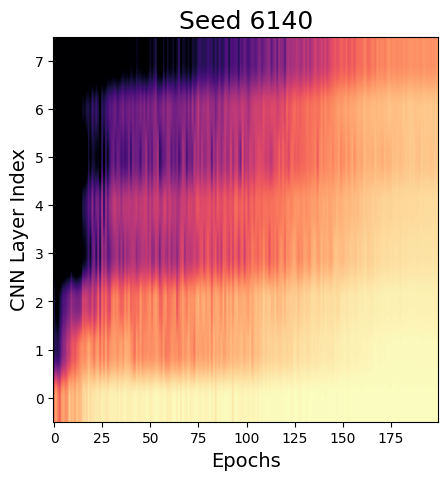

155
List of Layers: ['features.0', 'features.3', 'features.6', 'features.8', 'features.11', 'features.13', 'features.16', 'features.18']


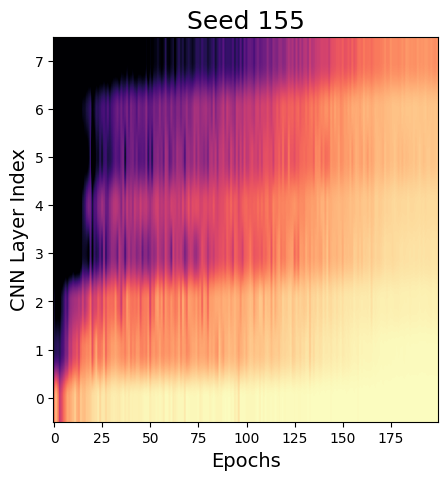

581
List of Layers: ['features.0', 'features.3', 'features.6', 'features.8', 'features.11', 'features.13', 'features.16', 'features.18']


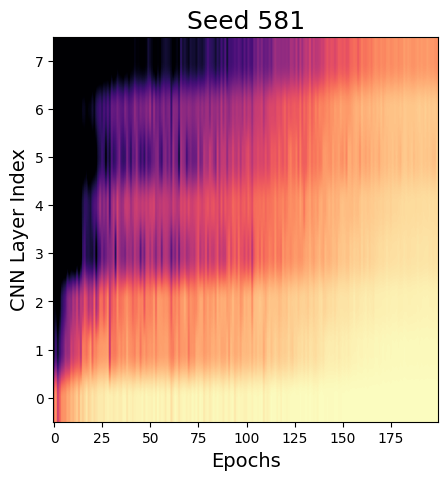

3959
List of Layers: ['features.0', 'features.3', 'features.6', 'features.8', 'features.11', 'features.13', 'features.16', 'features.18']


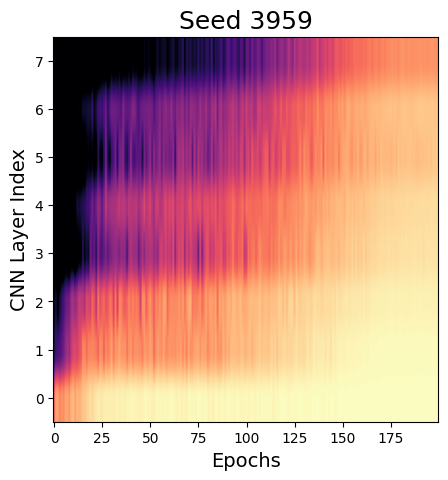

3176
List of Layers: ['features.0', 'features.3', 'features.6', 'features.8', 'features.11', 'features.13', 'features.16', 'features.18']


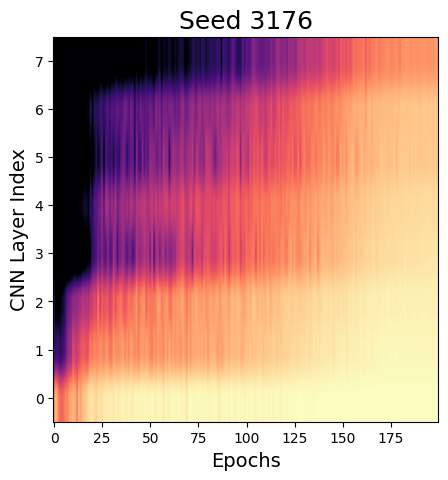

1176
List of Layers: ['features.0', 'features.3', 'features.6', 'features.8', 'features.11', 'features.13', 'features.16', 'features.18']


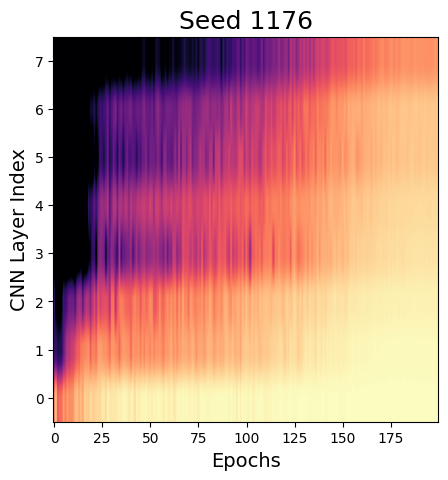

7147
List of Layers: ['features.0', 'features.3', 'features.6', 'features.8', 'features.11', 'features.13', 'features.16', 'features.18']


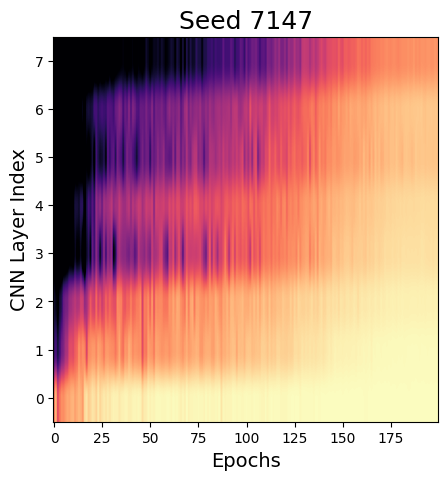

562
List of Layers: ['features.0', 'features.3', 'features.6', 'features.8', 'features.11', 'features.13', 'features.16', 'features.18']


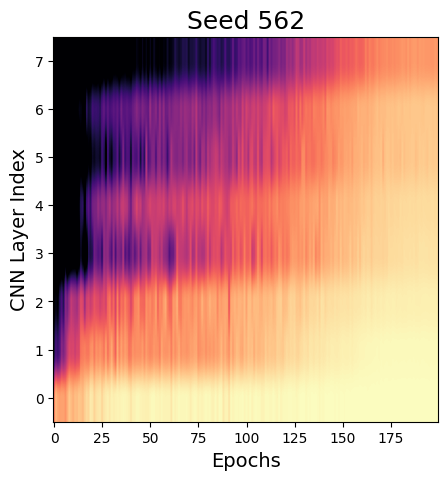

7908
List of Layers: ['features.0', 'features.3', 'features.6', 'features.8', 'features.11', 'features.13', 'features.16', 'features.18']


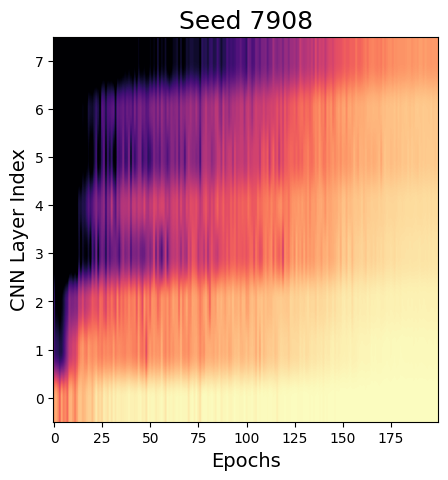

9204
List of Layers: ['features.0', 'features.3', 'features.6', 'features.8', 'features.11', 'features.13', 'features.16', 'features.18']


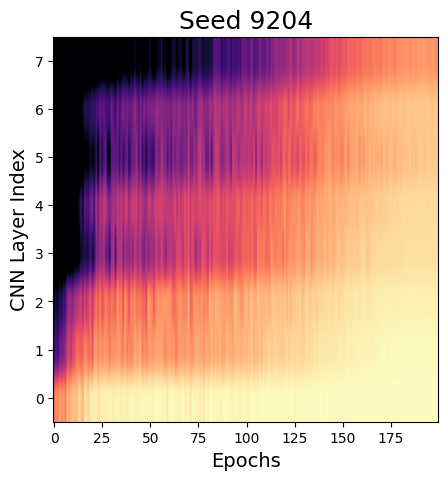

7076
List of Layers: ['features.0', 'features.3', 'features.6', 'features.8', 'features.11', 'features.13', 'features.16', 'features.18']


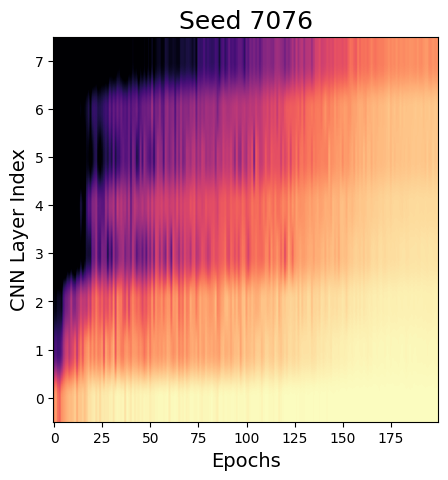

203
List of Layers: ['features.0', 'features.3', 'features.6', 'features.8', 'features.11', 'features.13', 'features.16', 'features.18']


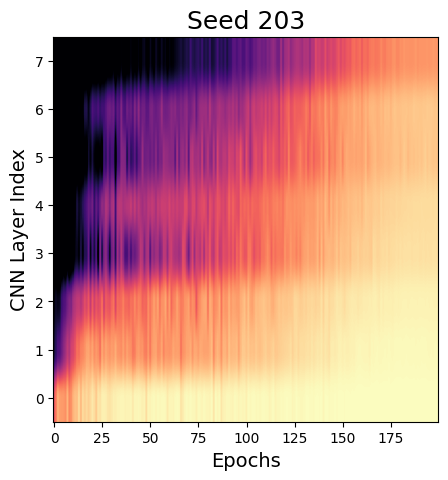

3631
List of Layers: ['features.0', 'features.3', 'features.6', 'features.8', 'features.11', 'features.13', 'features.16', 'features.18']


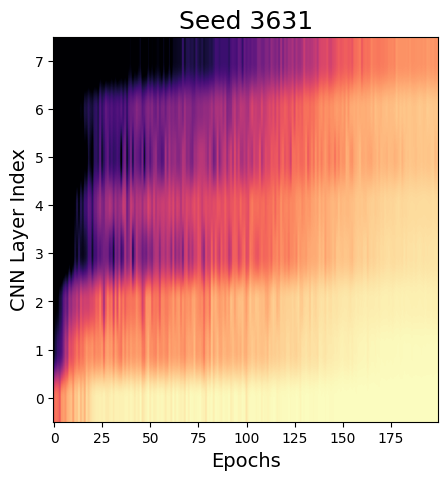

9151
List of Layers: ['features.0', 'features.3', 'features.6', 'features.8', 'features.11', 'features.13', 'features.16', 'features.18']


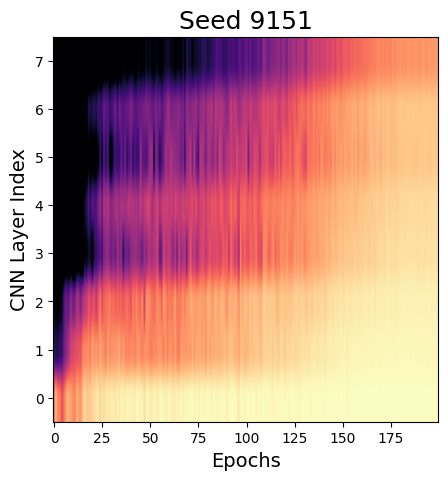

1244
List of Layers: ['features.0', 'features.3', 'features.6', 'features.8', 'features.11', 'features.13', 'features.16', 'features.18']


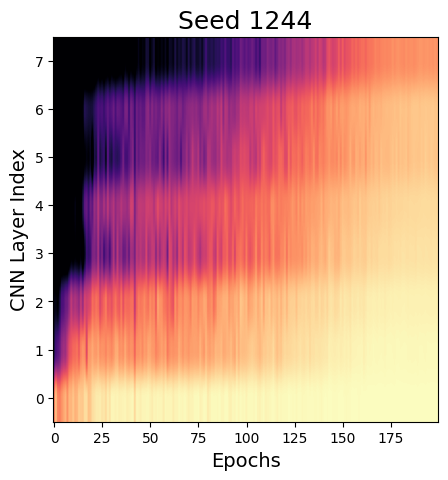

8210
List of Layers: ['features.0', 'features.3', 'features.6', 'features.8', 'features.11', 'features.13', 'features.16', 'features.18']


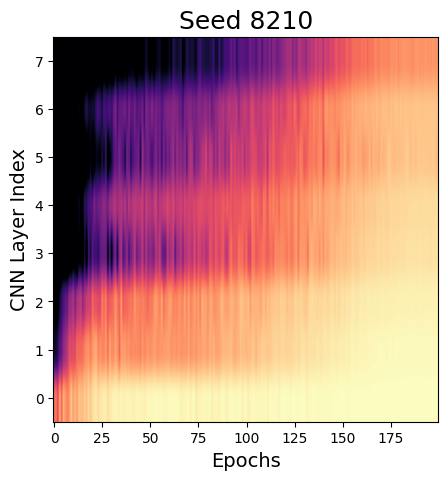

7830
List of Layers: ['features.0', 'features.3', 'features.6', 'features.8', 'features.11', 'features.13', 'features.16', 'features.18']


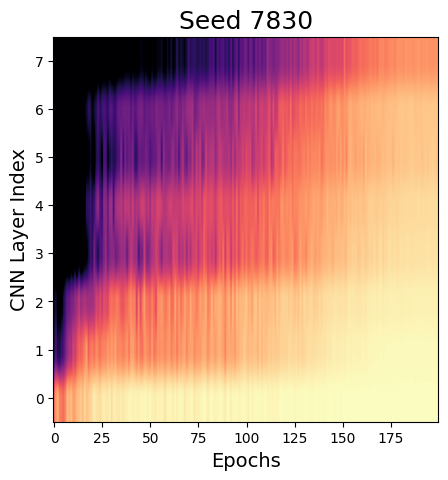

5661
List of Layers: ['features.0', 'features.3', 'features.6', 'features.8', 'features.11', 'features.13', 'features.16', 'features.18']


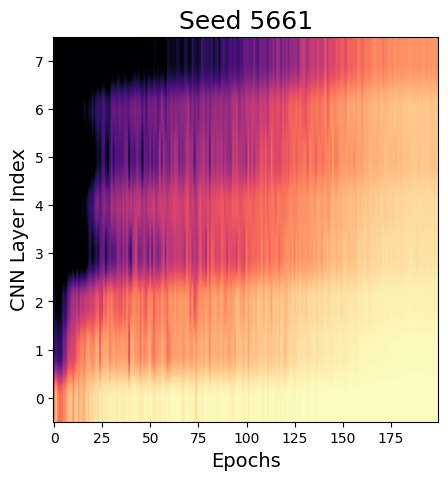

5842
List of Layers: ['features.0', 'features.3', 'features.6', 'features.8', 'features.11', 'features.13', 'features.16', 'features.18']


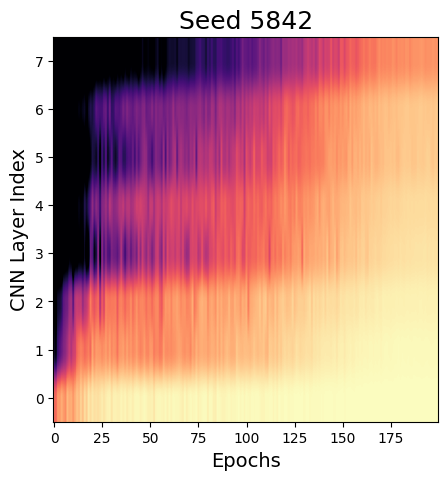

5835
List of Layers: ['features.0', 'features.3', 'features.6', 'features.8', 'features.11', 'features.13', 'features.16', 'features.18']


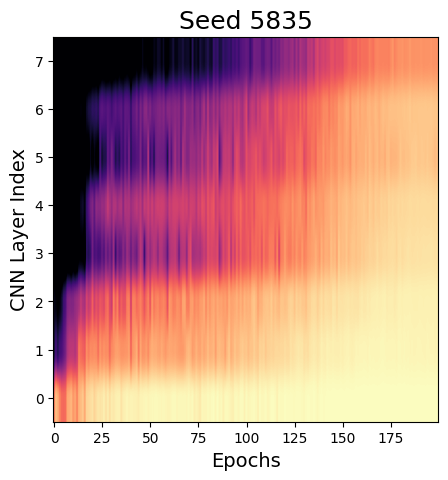

2093
List of Layers: ['features.0', 'features.3', 'features.6', 'features.8', 'features.11', 'features.13', 'features.16', 'features.18']


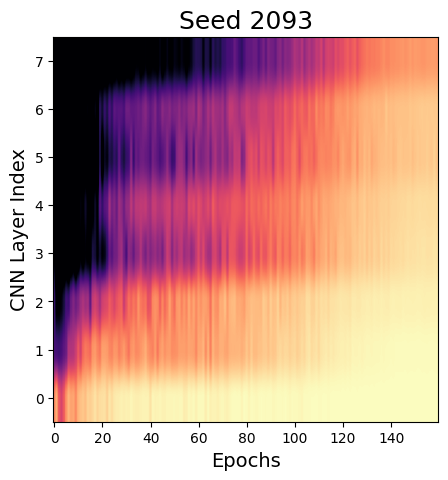

2765
List of Layers: ['features.0', 'features.3', 'features.6', 'features.8', 'features.11', 'features.13', 'features.16', 'features.18']


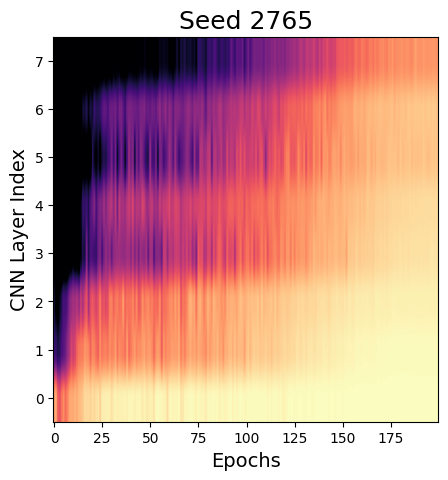

6256
List of Layers: ['features.0', 'features.3', 'features.6', 'features.8', 'features.11', 'features.13', 'features.16', 'features.18']


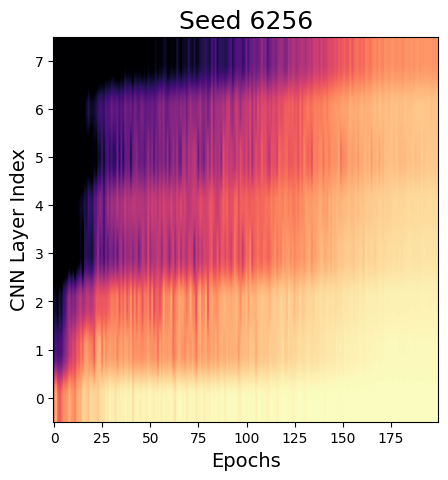

5887
List of Layers: ['features.0', 'features.3', 'features.6', 'features.8', 'features.11', 'features.13', 'features.16', 'features.18']


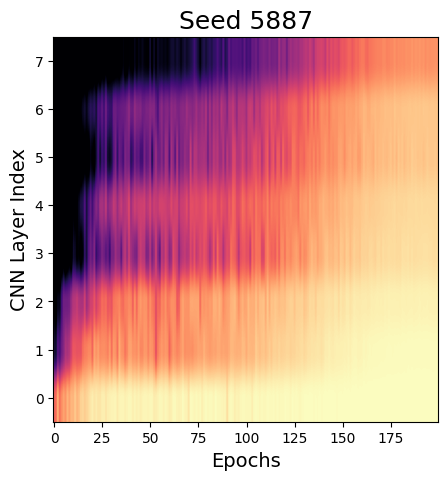

3575
List of Layers: ['features.0', 'features.3', 'features.6', 'features.8', 'features.11', 'features.13', 'features.16', 'features.18']


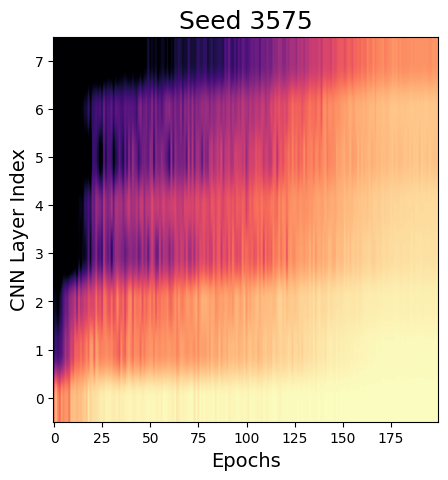

5245
List of Layers: ['features.0', 'features.3', 'features.6', 'features.8', 'features.11', 'features.13', 'features.16', 'features.18']


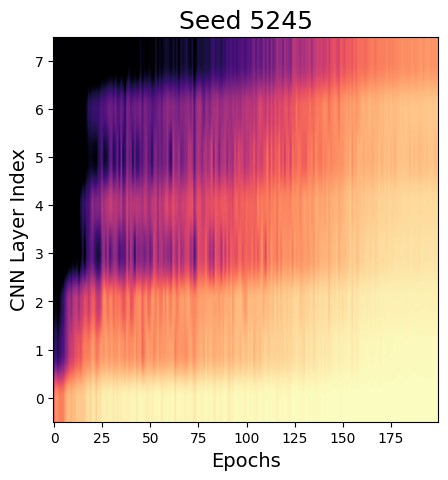

6921
List of Layers: ['features.0', 'features.3', 'features.6', 'features.8', 'features.11', 'features.13', 'features.16', 'features.18']


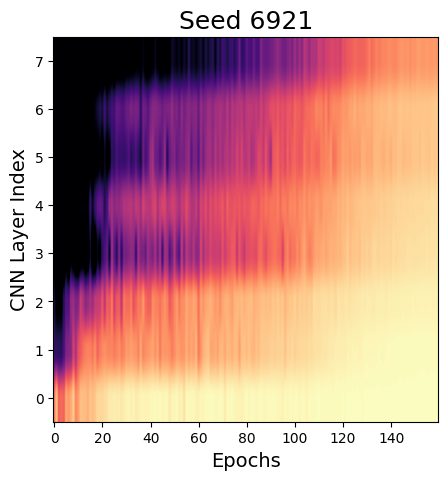

4273
List of Layers: ['features.0', 'features.3', 'features.6', 'features.8', 'features.11', 'features.13', 'features.16', 'features.18']


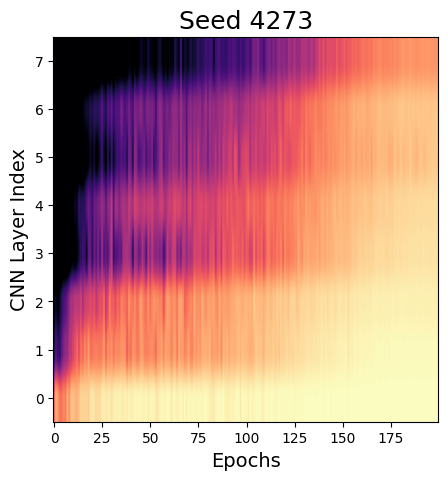

6810
List of Layers: ['features.0', 'features.3', 'features.6', 'features.8', 'features.11', 'features.13', 'features.16', 'features.18']


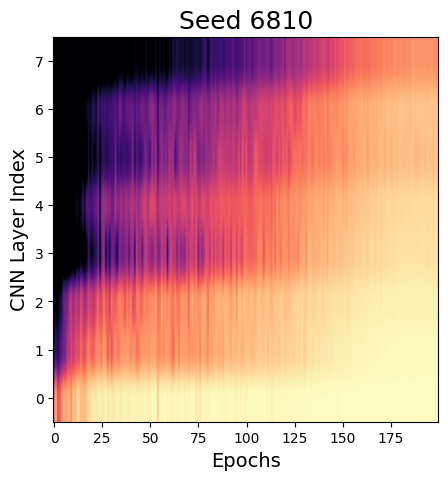

719
List of Layers: ['features.0', 'features.3', 'features.6', 'features.8', 'features.11', 'features.13', 'features.16', 'features.18']


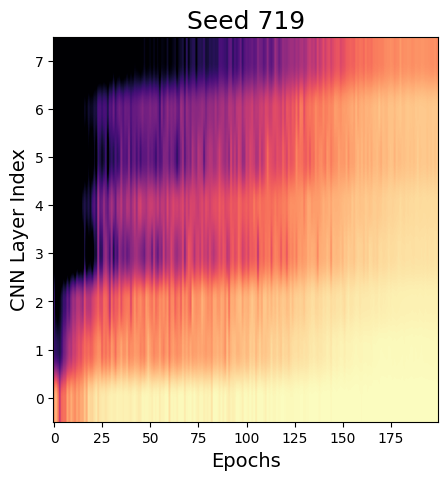

2248
List of Layers: ['features.0', 'features.3', 'features.6', 'features.8', 'features.11', 'features.13', 'features.16', 'features.18']


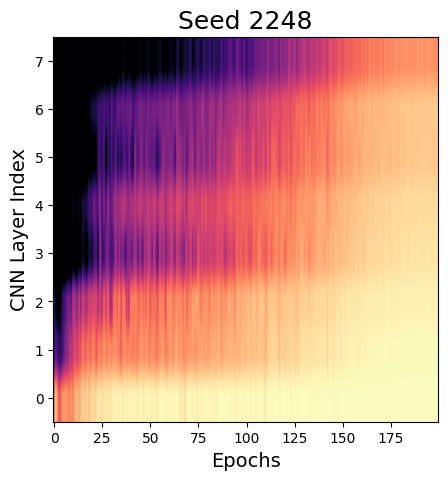

7809
List of Layers: ['features.0', 'features.3', 'features.6', 'features.8', 'features.11', 'features.13', 'features.16', 'features.18']


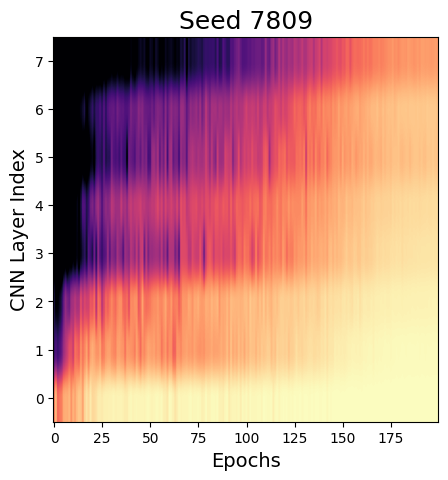

2562
List of Layers: ['features.0', 'features.3', 'features.6', 'features.8', 'features.11', 'features.13', 'features.16', 'features.18']


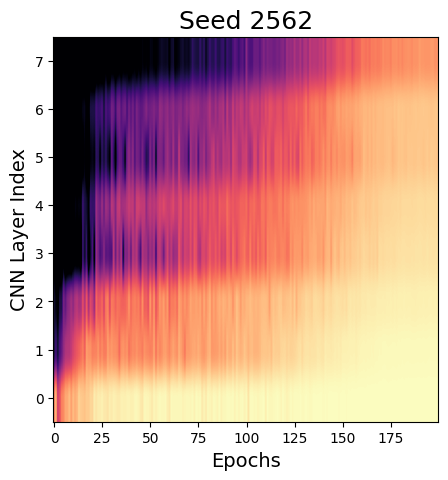

436
List of Layers: ['features.0', 'features.3', 'features.6', 'features.8', 'features.11', 'features.13', 'features.16', 'features.18']


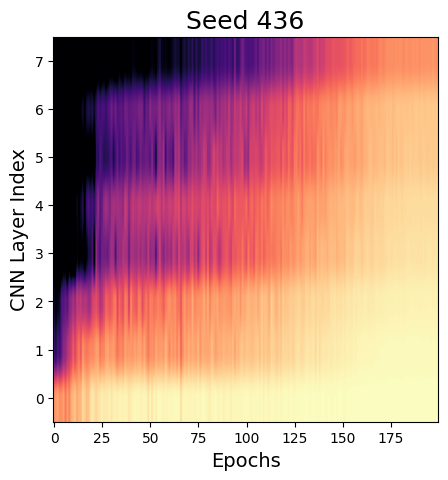

1956
List of Layers: ['features.0', 'features.3', 'features.6', 'features.8', 'features.11', 'features.13', 'features.16', 'features.18']


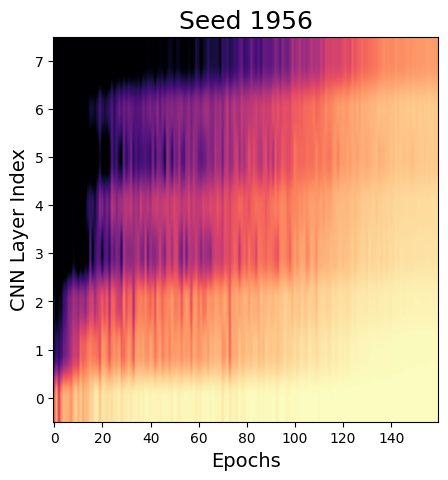

866
List of Layers: ['features.0', 'features.3', 'features.6', 'features.8', 'features.11', 'features.13', 'features.16', 'features.18']


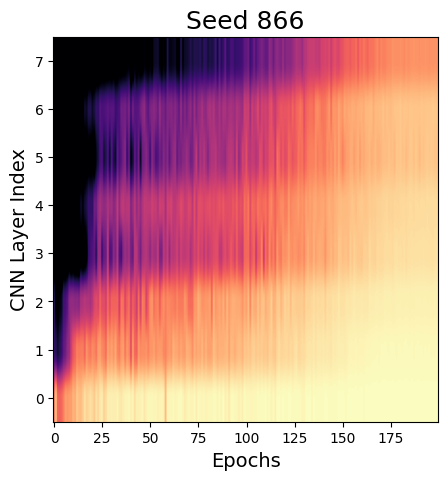

3307
List of Layers: ['features.0', 'features.3', 'features.6', 'features.8', 'features.11', 'features.13', 'features.16', 'features.18']


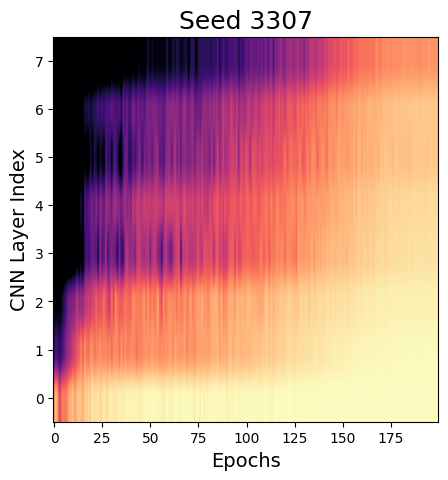

2544
List of Layers: ['features.0', 'features.3', 'features.6', 'features.8', 'features.11', 'features.13', 'features.16', 'features.18']


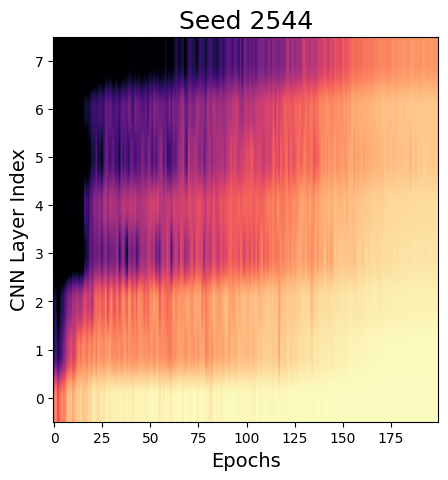

2200
List of Layers: ['features.0', 'features.3', 'features.6', 'features.8', 'features.11', 'features.13', 'features.16', 'features.18']


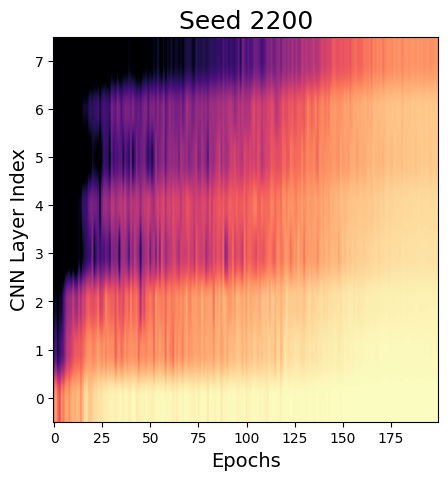

4601
List of Layers: ['features.0', 'features.3', 'features.6', 'features.8', 'features.11', 'features.13', 'features.16', 'features.18']


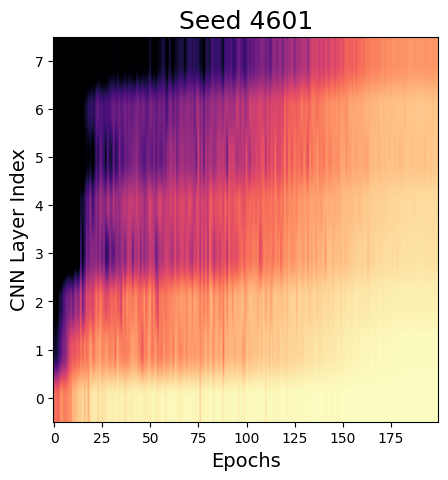

1766
List of Layers: ['features.0', 'features.3', 'features.6', 'features.8', 'features.11', 'features.13', 'features.16', 'features.18']


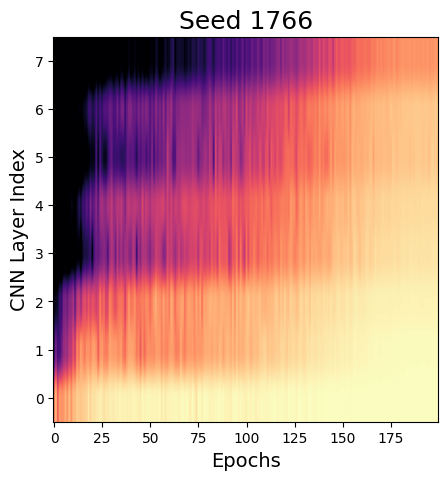

9296
List of Layers: ['features.0', 'features.3', 'features.6', 'features.8', 'features.11', 'features.13', 'features.16', 'features.18']


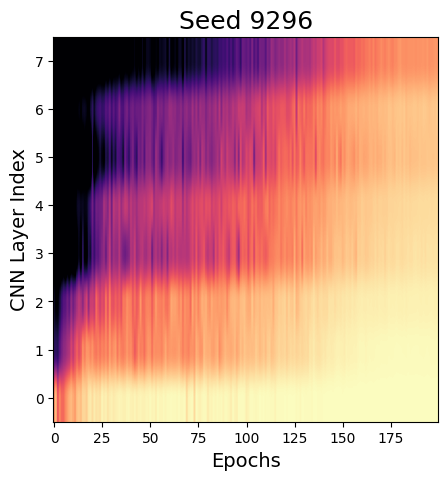

8388
List of Layers: ['features.0', 'features.3', 'features.6', 'features.8', 'features.11', 'features.13', 'features.16', 'features.18']


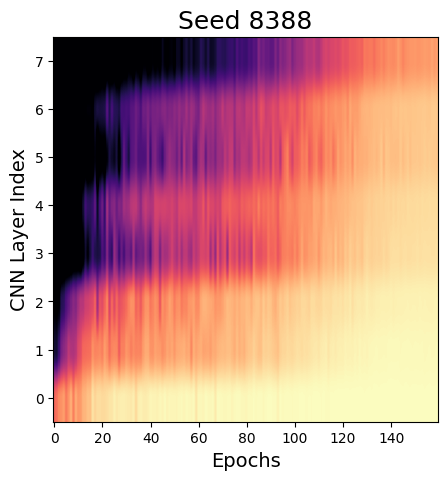

5325
List of Layers: ['features.0', 'features.3', 'features.6', 'features.8', 'features.11', 'features.13', 'features.16', 'features.18']


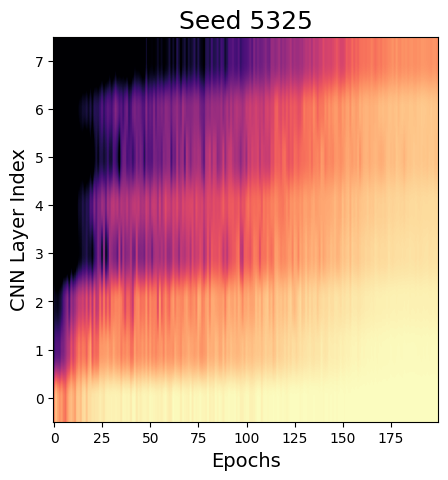

In [26]:
for seed_directory in seed_directories:
    path_to_cka = os.path.join(name_of_experiment, seed_directory, f"{model_name}_cka_values_across_epochs.pkl")
    match = re.search(r"(\d+)$", seed_directory)
    if match:
        seed = int(match.group(1))
        print(seed)
    plot_cka_over_time(path_to_cka, seed)

## (2) Compare the metrics of two different seeds, arbitrarily choose

In [27]:
def plot_accuracy_of_full_vs_similarity_guided_training_metrics(full_training_file, similarity_guided_training_file):
    with open(full_training_file, 'rb') as f:
        full_training = pickle.load(f)
    with open(similarity_guided_training_file, 'rb') as f:
        similarity_guided_training = pickle.load(f)

    acc_full, train_loss_full, test_loss_full = full_training
    acc_sim, train_loss_sim, test_loss_sim = similarity_guided_training

    epochs = list(range(1, len(acc_full) + 1))

    for index, (acc1, acc2) in enumerate(zip(acc_full, acc_sim)):
        acc_full[index] = acc1 * 100.0
        acc_sim[index] = acc2 * 100.0
    print(f"Max Accuracy Full Training: {max(acc_full)}")
    print(f"Max Accuracy Similarity-Guided Training: {max(acc_sim)}")
    # Plot Accuracy
    plt.figure(figsize=(10, 4))
    plt.plot(epochs, acc_full, label='End-to-End Accuracy')
    plt.plot(epochs, acc_sim, label='Similarity-Guided Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.title('Accuracy over Epochs')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot Training Loss
    plt.figure(figsize=(10, 4))
    plt.plot(epochs, train_loss_full, label='End-to-End Training Loss')
    plt.plot(epochs, train_loss_sim, label='Similarity-Guided Training Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Training Loss')
    plt.title('Training Loss over Epochs')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot Validation Loss
    plt.figure(figsize=(10, 4))
    plt.plot(epochs, train_loss_full, label='End-to-End Validation Loss')
    plt.plot(epochs, train_loss_sim, label='Similarity-Guided Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Validation Loss')
    plt.title('Validation Loss over Epochs')
    plt.legend()
    plt.grid(True)
    plt.show()

Max Accuracy Full Training: 68.24
Max Accuracy Similarity-Guided Training: 68.22


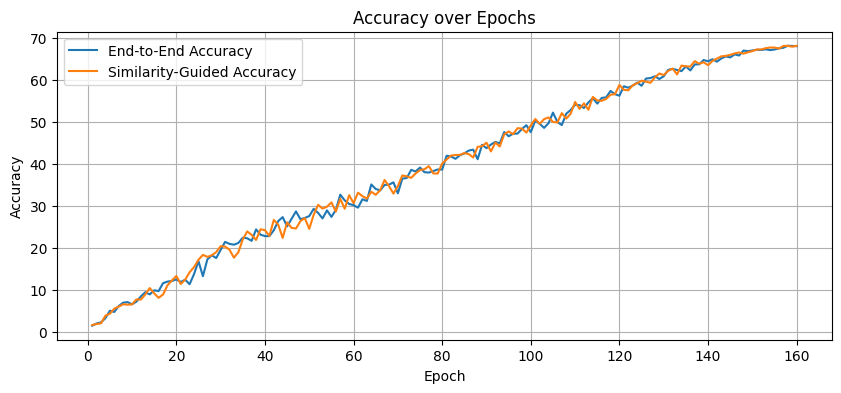

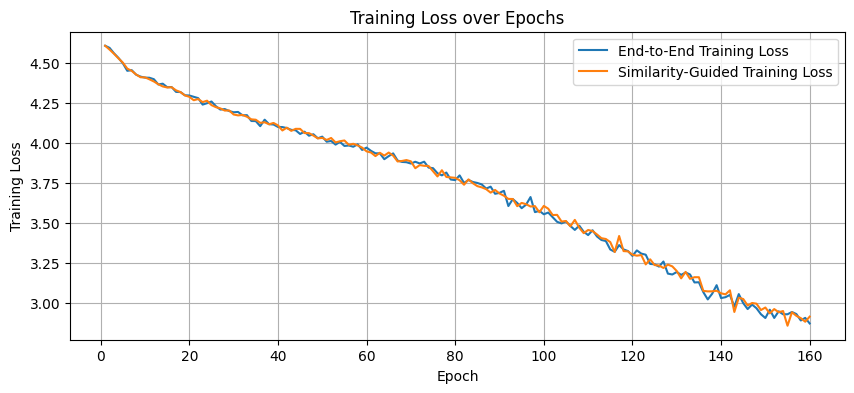

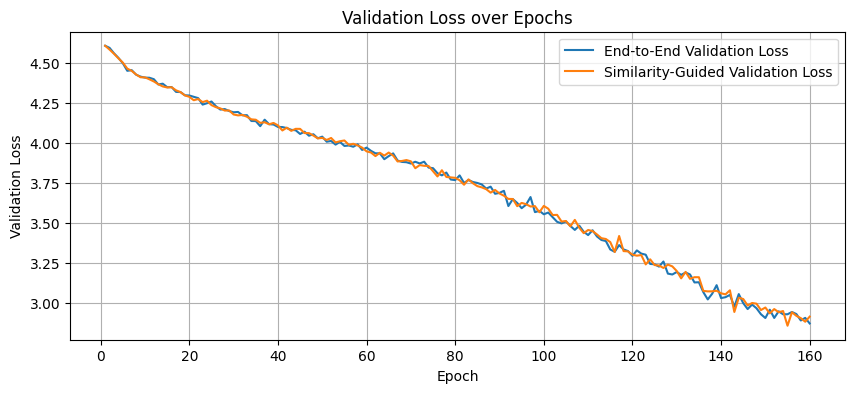

In [28]:
seed_test_1 = 6921
seed_test_2 = 2093
plot_accuracy_of_full_vs_similarity_guided_training_metrics(os.path.join(name_of_experiment, f"seed_{seed_test_1}", f"fully_trained_reference_model_{model_name}_metrics.pkl"), os.path.join(name_of_experiment, f"seed_{seed_test_2}", f"fully_trained_reference_model_{model_name}_metrics.pkl"))

## (3) Plot CKA Curves to Compare

In [29]:
def plot_cka_over_time_results(all_epochs_matrix, number_of_conv, seed):
    # Convert PyTorch tensor to NumPy if needed
    if isinstance(all_epochs_matrix, torch.Tensor):
        all_epochs_matrix = all_epochs_matrix.cpu().numpy()

    num_rows, num_cols = all_epochs_matrix.shape
    time_steps = np.arange(num_rows)

    for i in range(number_of_conv):
        plt.title(f"Conv # {i}, Seed {seed}")
        plt.plot(time_steps, all_epochs_matrix[:, i])
    plt.show()

def compare_plots_of_cka_over_time(all_epochs_matrix_one, all_epochs_matrix_two, number_of_conv, seed_one, seed_two):
    if isinstance(all_epochs_matrix_one, torch.Tensor):
        all_epochs_matrix_one = all_epochs_matrix_one.cpu().numpy()
        all_epochs_matrix_two = all_epochs_matrix_two.cpu().numpy()
    
    num_rows, num_cols = all_epochs_matrix_one.shape
    time_steps = np.arange(num_rows)
    for i in range(number_of_conv):
        plt.title(f"Conv # {i}, Seed {seed_one} vs. Seed {seed_two}")
        plt.plot(time_steps, all_epochs_matrix_one[:, i])
        plt.plot(time_steps, all_epochs_matrix_two[:, i])
    plt.show()

def compare_same_cnn_layers_cka_over_time(seed_dirs):
    global name_of_experiment
    time_steps_160 = np.arange(160)
    time_steps_200 = np.arange(200)
    dict_for_corresponding_layers_160 = defaultdict(list)
    dict_for_corresponding_layers_200 = defaultdict(list)
    
    for seed_dir in seed_dirs:
        cka_over_time_file = os.path.join(name_of_experiment, seed_dir, f"{model_name}_cka_values_across_epochs.pkl")
        with open(cka_over_time_file, "rb") as f:
            cka_over_time = pickle.load(f)
        list_of_layers = list(cka_over_time.keys())
        max_epochs = max(len(cka_over_time[key]) for key in list(cka_over_time.keys()))
        if max_epochs == 160:
            for layer_name in list_of_layers:
                dict_for_corresponding_layers_160[layer_name].append(cka_over_time[layer_name])
        elif max_epochs == 200:
            for layer_name in list_of_layers:
                dict_for_corresponding_layers_200[layer_name].append(cka_over_time[layer_name])
    
    # Begin plotting correspondign layers
    for layer_name in list_of_layers:
        plt.title(f"Corresponding Layer Plot for {layer_name}, 160 epochs VGG11")
        for seed_index, cka_values in enumerate(dict_for_corresponding_layers_160[layer_name]):
            plt.plot(time_steps_160, cka_values, label=f"Seed Index: {seed_index}")
        plt.legend()
        plt.show()
    # Begin plotting correspondign layers
    for layer_name in list_of_layers:
        plt.title(f"Corresponding Layer Plot for {layer_name}, 200 epochs VGG11")
        for seed_index, cka_values in enumerate(dict_for_corresponding_layers_200[layer_name]):
            plt.plot(time_steps_200, cka_values, label=f"Seed Index: {seed_index}")
        plt.legend()
        plt.show()
def process_cka_over_time_file_for_plot(seed_directory):
    global name_of_experiment
    cka_over_time_file = os.path.join(name_of_experiment, seed_directory, f"{model_name}_cka_values_across_epochs.pkl")
    with open(cka_over_time_file, "rb") as f:
        cka_over_time = pickle.load(f)
    list_of_layers = list(cka_over_time.keys())
    max_epochs = max(len(cka_over_time[key]) for key in list(cka_over_time.keys()))
    max_layers = len(list_of_layers)
    cka_matrix = torch.zeros((max_layers, max_epochs))
    for layer_index, layer in enumerate(list_of_layers):
        max_epochs_trained_for_layer = len(cka_over_time[layer])
        for epoch in range(max_epochs_trained_for_layer):
            cka_matrix[layer_index][epoch] = cka_over_time[layer][epoch]
    all_epochs_matrix = cka_matrix.T
    return all_epochs_matrix

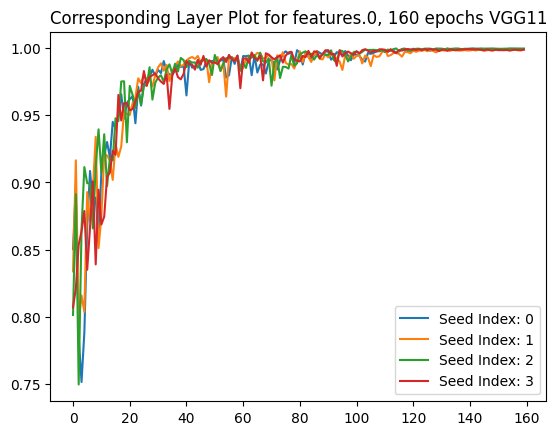

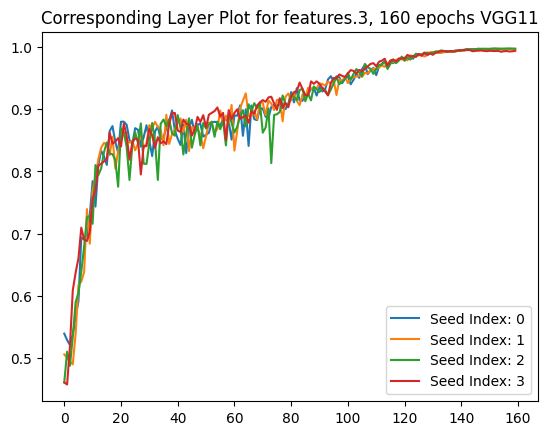

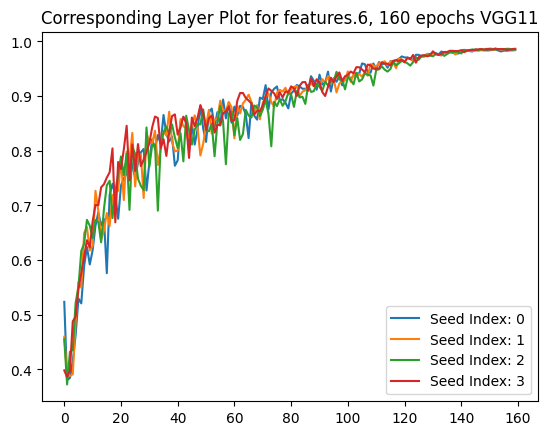

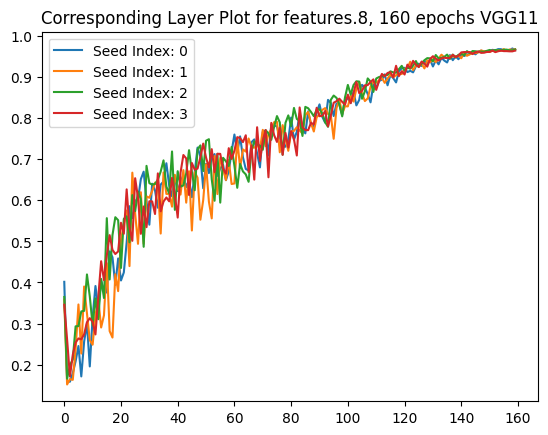

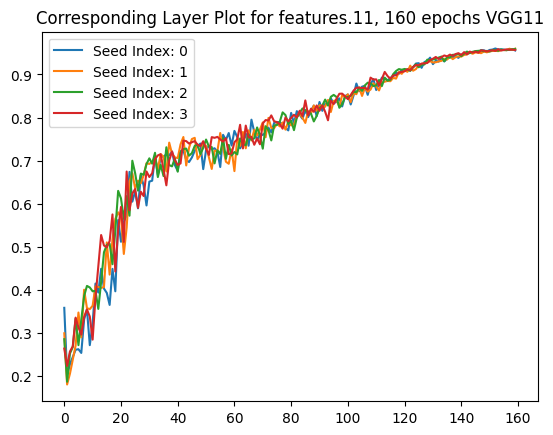

...

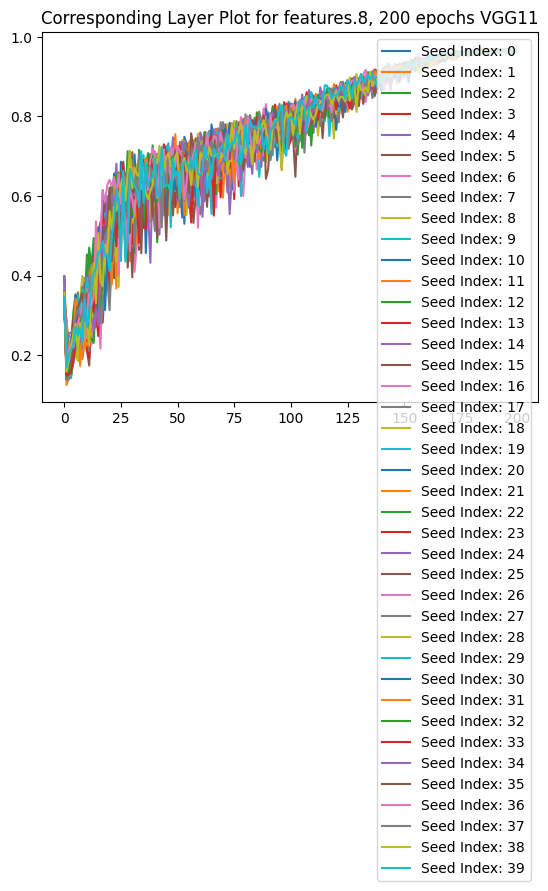

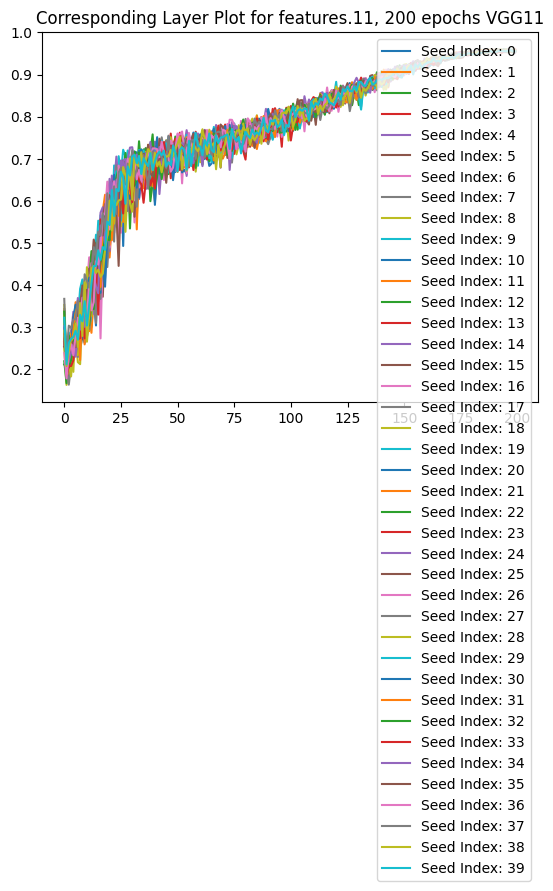

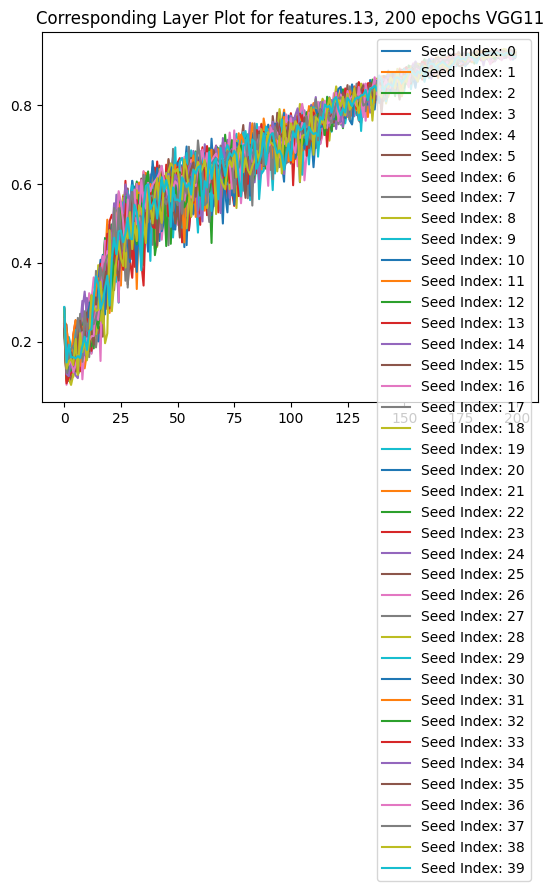

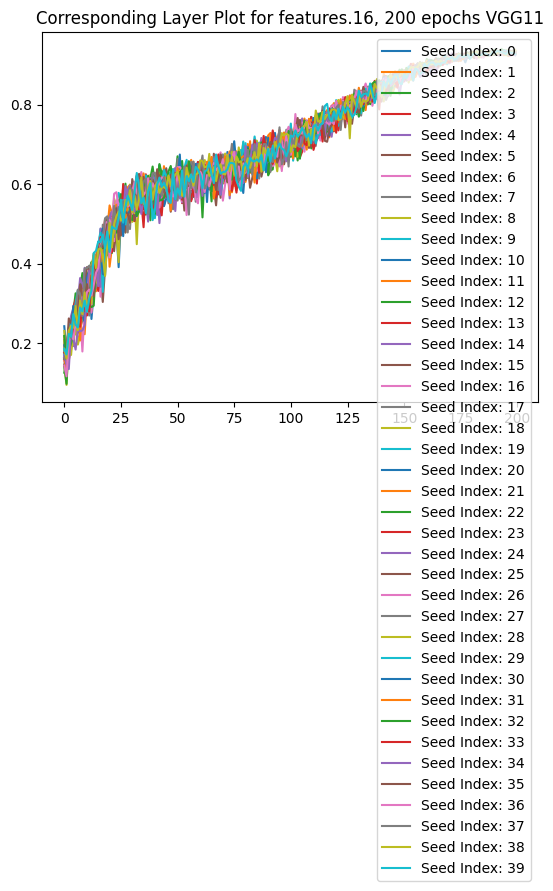

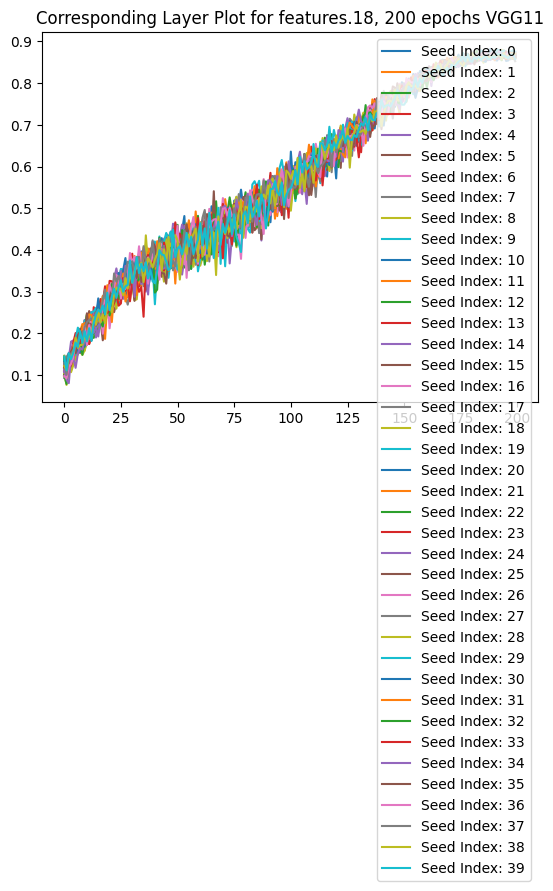

In [30]:
compare_same_cnn_layers_cka_over_time(seed_directories)

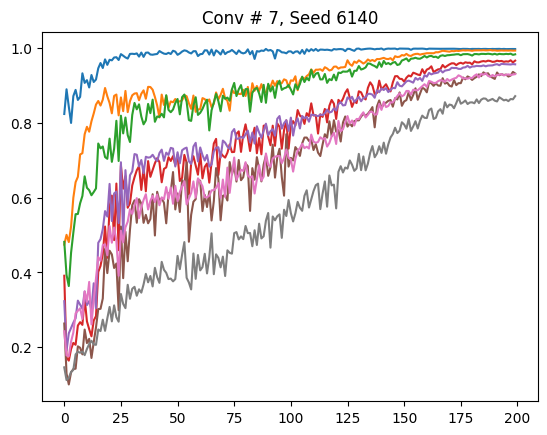

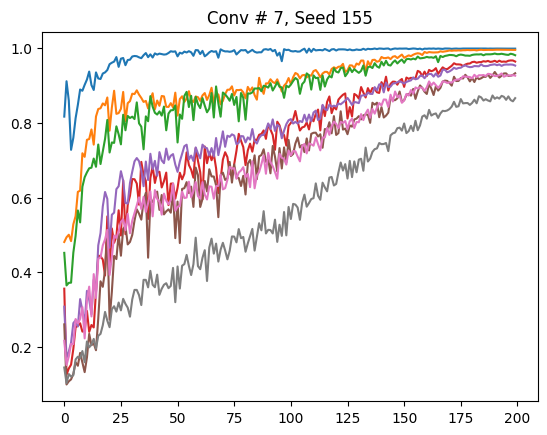

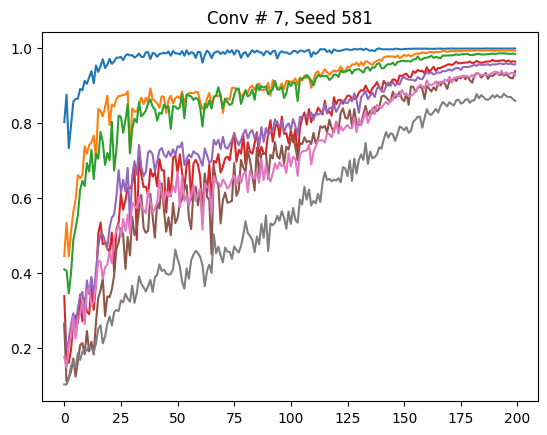

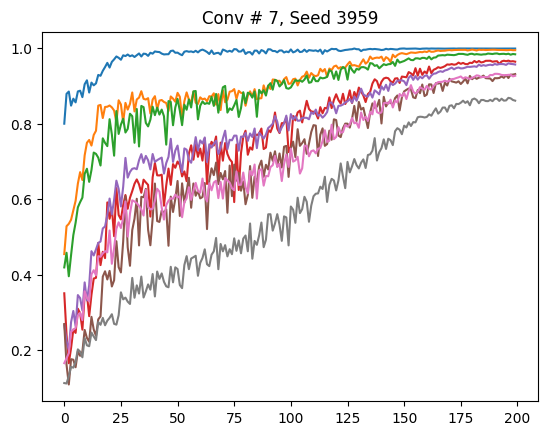

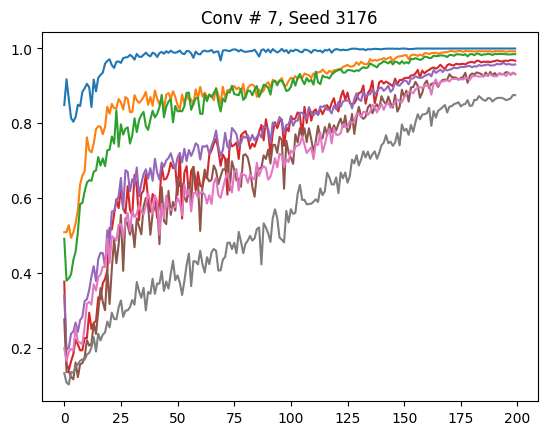

...

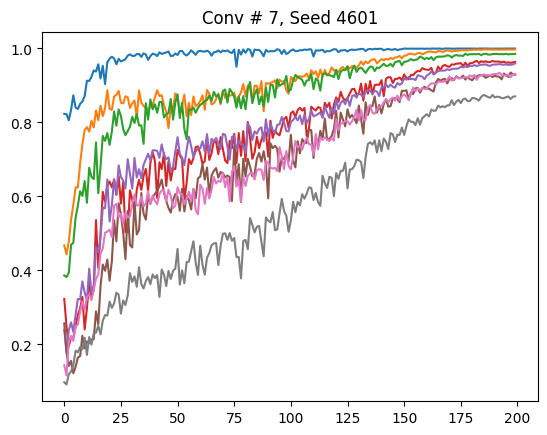

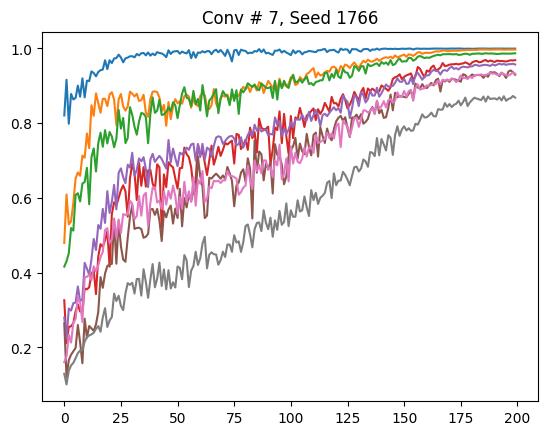

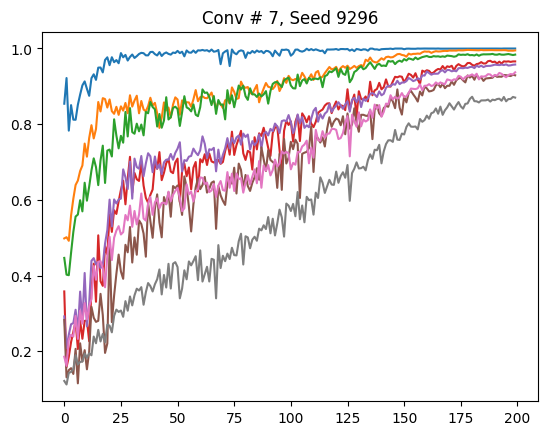

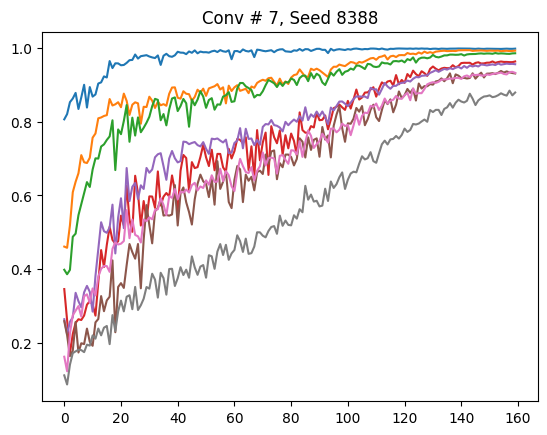

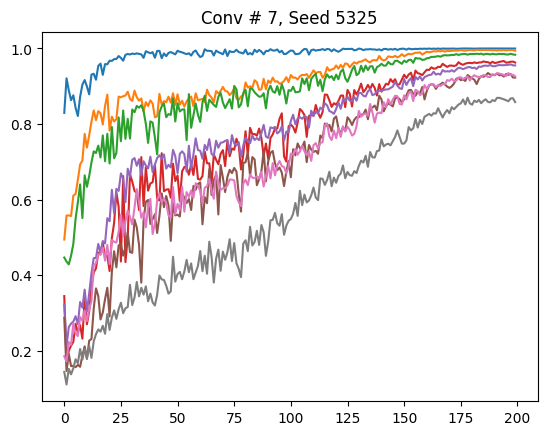

In [31]:
for seed_directory in seed_directories:
    all_epochs_matrix = process_cka_over_time_file_for_plot(seed_directory)
    match = re.search(r"(\d+)$", seed_directory)
    if match:
        seed = int(match.group(1))
    plot_cka_over_time_results(all_epochs_matrix, number_of_cnn_layers, seed)

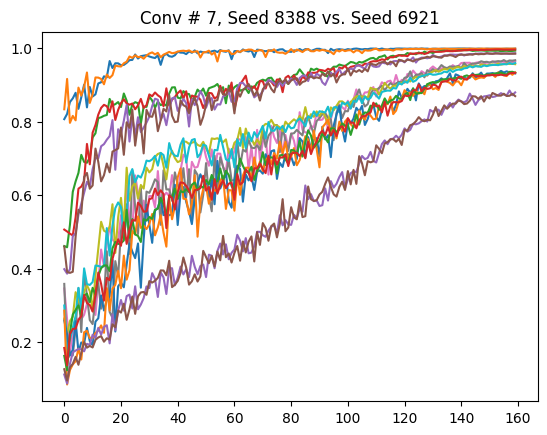

In [16]:
# Compare CKA of different seeds
seed_one_test = 8388
seed_two_test = 6921
all_epochs_matrix_one = process_cka_over_time_file_for_plot(f"seed_{seed_one_test}")
all_epochs_matrix_two = process_cka_over_time_file_for_plot(f"seed_{seed_two_test}")
compare_plots_of_cka_over_time(all_epochs_matrix_one, all_epochs_matrix_two, number_of_cnn_layers, seed_one_test, seed_two_test)

## (4) Generate Labels Based on Variance of CKA Values

In [32]:
def get_all_stability_points_for_all_layers(
    all_epochs_matrix, conv_indices, layers, seed, moving_window=20, stride=5, stability_threshold=0.0001, cka_change_rate_threshold_between_strides=0.1
):
    cka_freeze_configuration = {layer: [] for layer in layers}
    num_epochs = all_epochs_matrix.shape[0]

    for conv_idx in conv_indices:
        cka_vals = all_epochs_matrix[:, conv_idx]
        if hasattr(cka_vals, 'cpu'):
            cka_vals = cka_vals.cpu().numpy()

        cka_window_values = []
        variance_values = []   # Store variance for plotting
        variance_epochs = []   # Track the center of the window for plotting

        prev_decision_was_frozen = False
        prev_CKA_at_decision_for_frozen = None

        for epoch, cka_val in enumerate(cka_vals):
            cka_window_values.append(cka_val)

            if len(cka_window_values) > moving_window:
                cka_window_values = cka_window_values[stride:]

            if len(cka_window_values) == moving_window:
                window_variance = np.var(cka_window_values, ddof=1)

                center_epoch = (epoch - moving_window + 1) // 2
                start_of_epoch = epoch - moving_window + 1
                # print(f"The Current Epoch: {epoch}, Start of Epoch: {epoch} - {moving_window} = {start_of_epoch}")
                variance_values.append(window_variance)
                variance_epochs.append(center_epoch)
                # After the initial freeze decision, make it so that all labels subsequently are of a frozen layer
                # Doesn't make sense to go back and forth with freezing, measure performance difference after. Weights should change slightly anyway
                if window_variance < stability_threshold and cka_val > 0.3 or cka_freeze_configuration[layers[conv_idx]][-1] == 1:
                    # print(f"Layer {conv_idx} — CKA value when freezing: ", cka_val)
                    # print("Variance of window: ", window_variance)
                    cka_freeze_configuration[layers[conv_idx]].append(1) # 1 for frozen layer
                    cka_freeze_configuration[layers[conv_idx]][-moving_window:] = [1] * moving_window # replace last moving_window elements with 1 for frz
                    prev_decision_was_frozen = True
                    prev_CKA_at_decision_for_frozen = cka_val
                else:
                  cka_freeze_configuration[layers[conv_idx]].append(0) # 0 for non-frozen layer
                  prev_decision_was_frozen = False
                  prev_CKA_at_decision_for_frozen = None
            else:
              if prev_decision_was_frozen:
                # Get percent change, has to be a less than 3% change from the CKA value that was previously frozen at
                prev_cka_value_pct_change = abs(prev_CKA_at_decision_for_frozen - cka_val) / prev_CKA_at_decision_for_frozen
                if prev_cka_value_pct_change < cka_change_rate_threshold_between_strides:
                  cka_freeze_configuration[layers[conv_idx]].append(1) # following previous decision of layer freezing
                else:
                  print(f"GREATER THAN {int(cka_change_rate_threshold_between_strides * 100.0)} CHANGE IN CKA VALUE, NOT CHOSEN AS A FROZEN LAYER")
                  cka_freeze_configuration[layers[conv_idx]].append(0)
              else:
                cka_freeze_configuration[layers[conv_idx]].append(0) # following previous decision of layer freezing, or there haven't been enough epochs for test

        # Plotting
        fig, ax1 = plt.subplots(figsize=(12, 6))

        ax1.plot(cka_vals, label='Raw CKA', color='blue', alpha=0.3)
        ax1.set_xlabel('Epoch')
        ax1.set_ylabel('CKA Similarity', color='blue')
        ax1.tick_params(axis='y', labelcolor='blue')
        ax1.set_ylim(0, 1.0)

        # Plot variance on secondary axis
        ax2 = ax1.twinx()
        ax2.plot(variance_epochs, variance_values, label='Variance', color='orange')
        ax2.set_ylabel('Window Variance', color='orange')
        ax2.set_ylim(0.0001, 0.001)
        ax2.tick_params(axis='y', labelcolor='orange')

        # Plot the first stability marker if found
        frz_moment = [epoch_index for epoch_index, frz_decision in enumerate(cka_freeze_configuration[layers[conv_idx]]) if frz_decision == 1]
        cka_val_at_frz_moment = [cka_vals[epoch_index] for epoch_index in frz_moment]
        if frz_moment is not None:
            ax1.plot(frz_moment, cka_val_at_frz_moment, 'ro', label=f'Stability Point (<{stability_threshold})')

        fig.suptitle(f'Seed {seed}, CKA and Variance — Conv {layers[conv_idx]}')
        fig.tight_layout()
        fig.legend(loc='upper right')
        plt.grid(True)
        plt.show()

    return cka_freeze_configuration

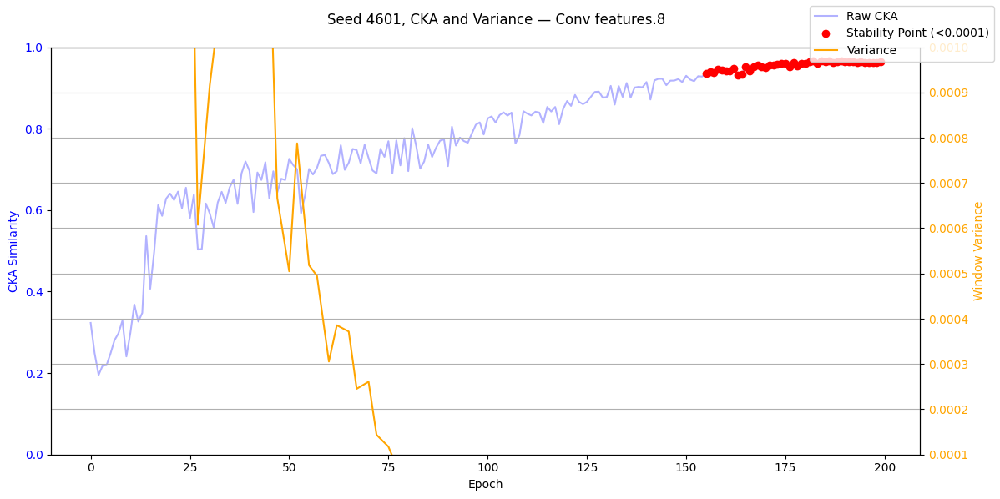

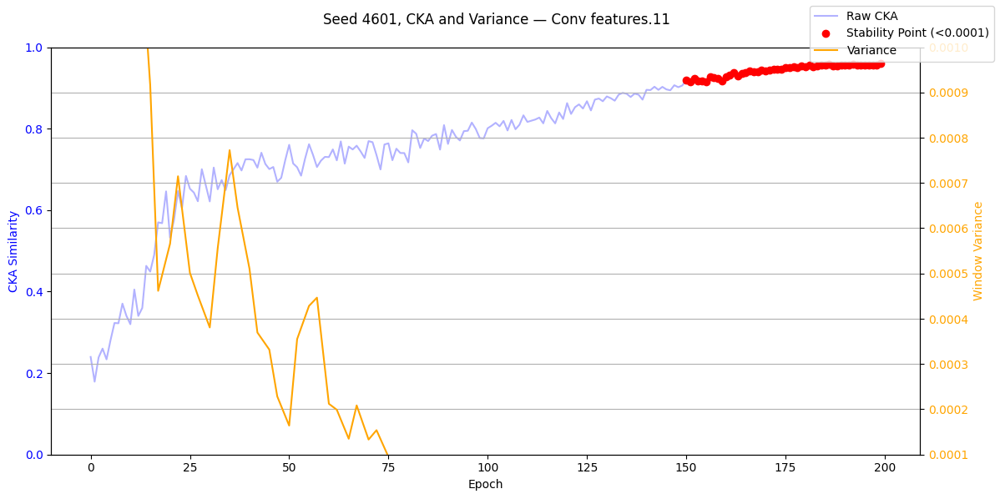

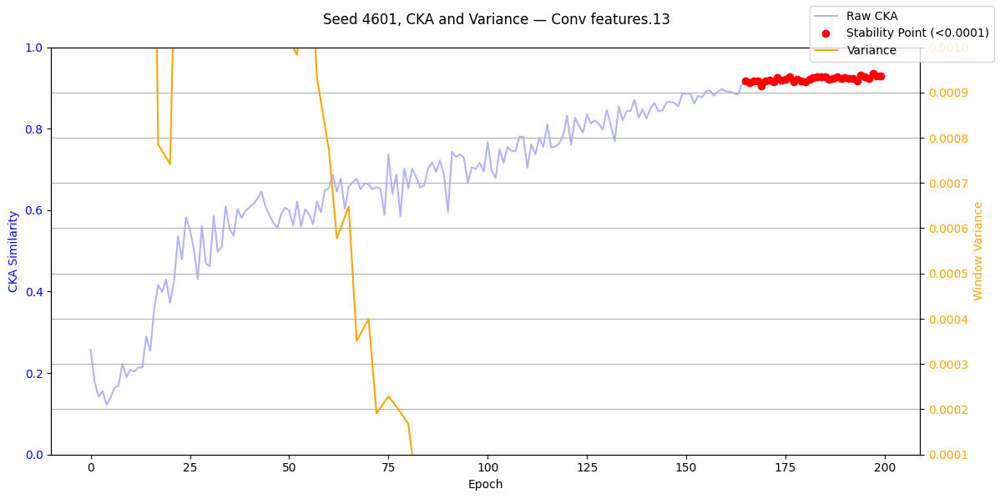

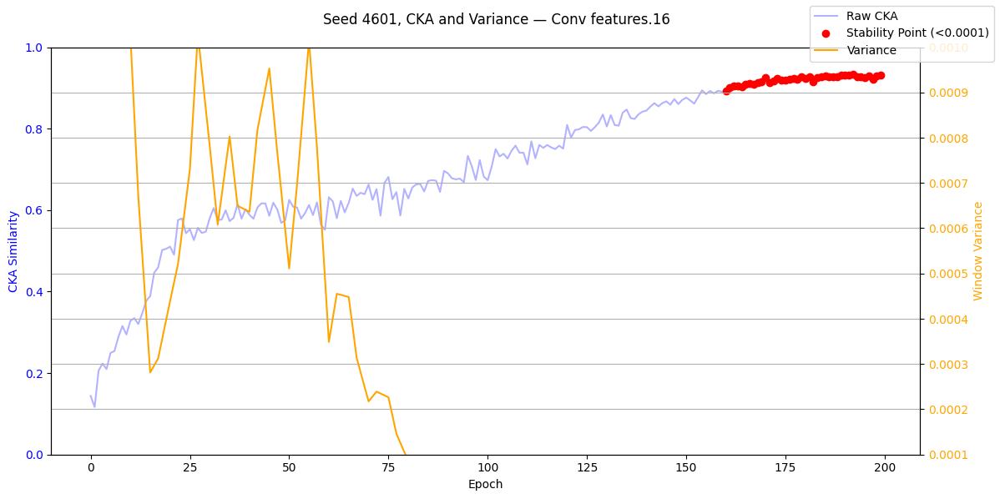

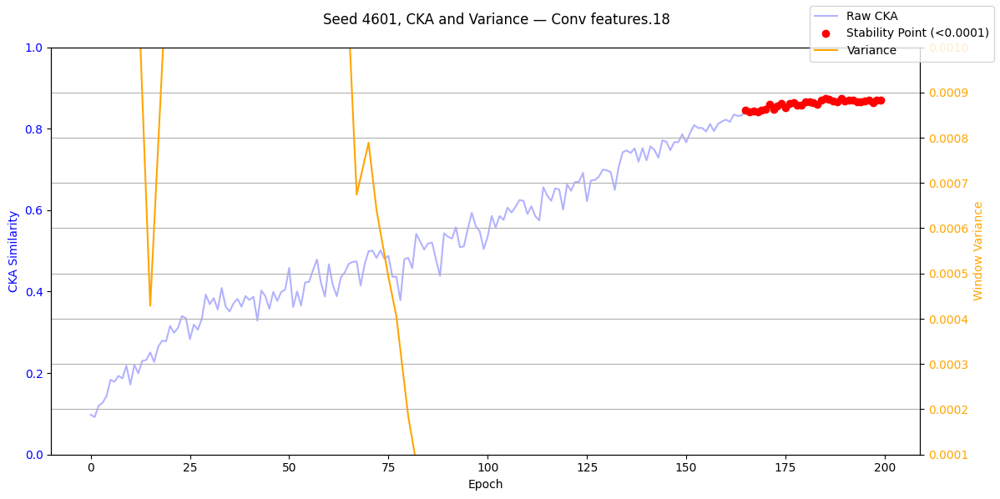

...

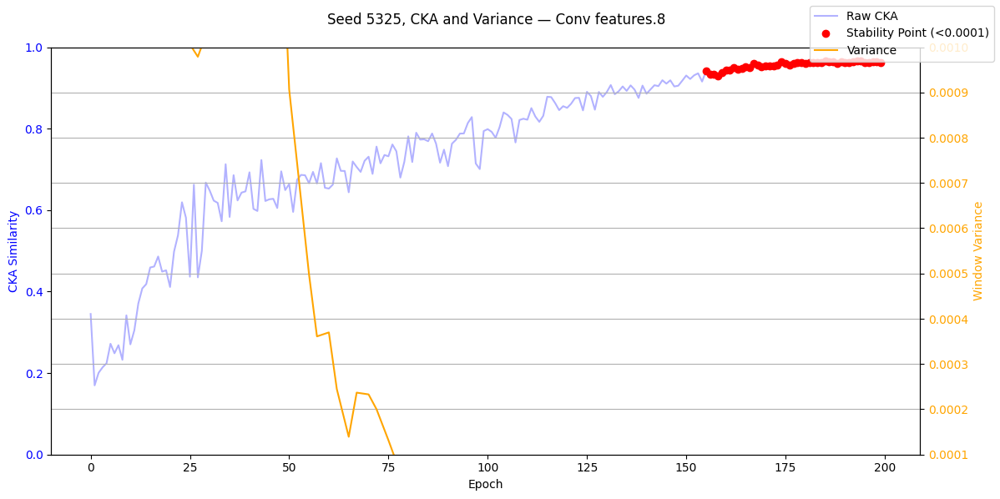

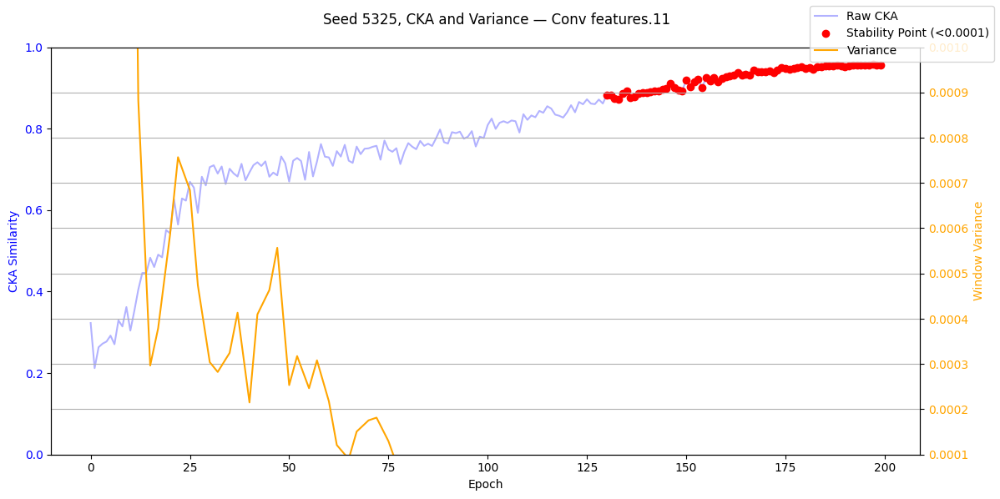

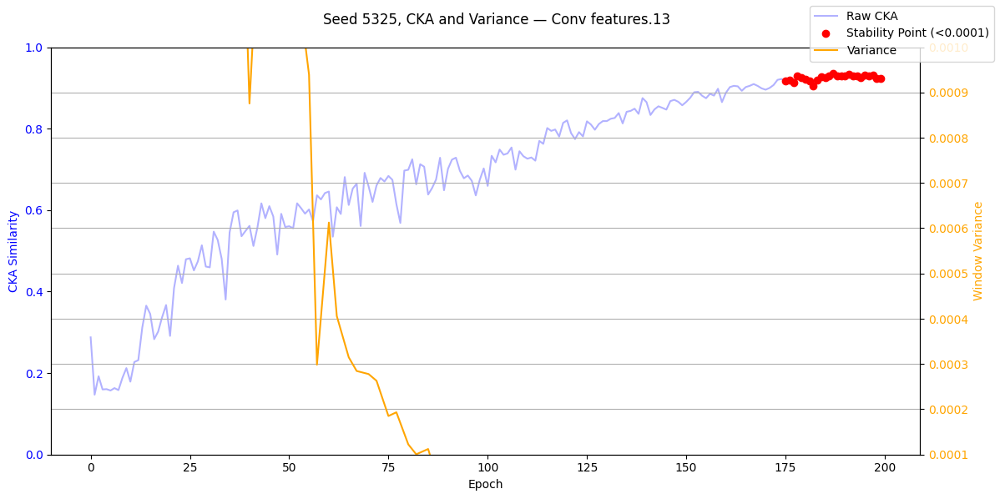

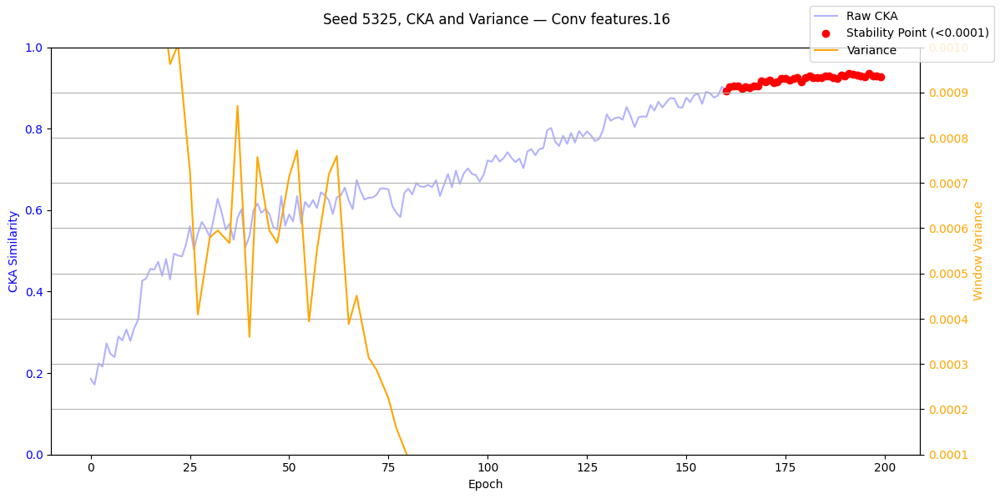

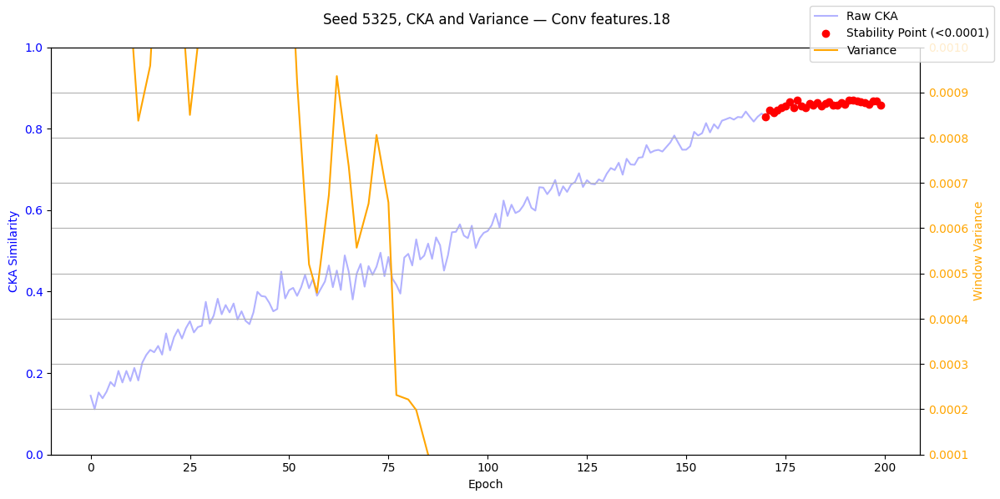

In [33]:
cka_frz_layer_configurations = {}
for seed_directory in seed_directories:
    match = re.search(r"(\d+)$", seed_directory)
    if match:
        seed = int(match.group(1))
    all_epochs_matrix = process_cka_over_time_file_for_plot(seed_directory)
    cka_configuration = get_all_stability_points_for_all_layers(all_epochs_matrix, seed=seed, conv_indices=[i for i in range(number_of_cnn_layers)], layers=layer_names)
    cka_frz_layer_configurations[seed] = cka_configuration

## (5) Look at Number of Frozen vs. Non-Frozen Samples Generated Per Seed

In [34]:
number_of_frozen_samples = 0
number_of_non_frozen_samples = 0
for seed_num, frz_predictions in cka_frz_layer_configurations.items():
    seed_frz_epochs = 0
    seed_no_frz_epochs = 0
    for layer_name in layer_names:
        layer_frz_predictions = frz_predictions[layer_name]
        seed_frz_epochs += sum([pred == 1 for pred in layer_frz_predictions])
        seed_no_frz_epochs += sum([pred == 0 for pred in layer_frz_predictions])
    number_of_frozen_samples += seed_frz_epochs
    number_of_non_frozen_samples += seed_no_frz_epochs
    print(f"Seed {seed_num}, #of Frz Samples: {seed_frz_epochs}, #of NoFrz Samples: {seed_no_frz_epochs}", "#total", seed_frz_epochs+seed_no_frz_epochs)
print(f"Total number of Frozen Samples: {number_of_frozen_samples}, Total number of Non-Frozen Samples: {number_of_non_frozen_samples}")

Seed 6140, #of Frz Samples: 520, #of NoFrz Samples: 1080 #total 1600
Seed 155, #of Frz Samples: 550, #of NoFrz Samples: 1050 #total 1600
Seed 581, #of Frz Samples: 555, #of NoFrz Samples: 1045 #total 1600
Seed 3959, #of Frz Samples: 570, #of NoFrz Samples: 1030 #total 1600
Seed 3176, #of Frz Samples: 545, #of NoFrz Samples: 1055 #total 1600
Seed 1176, #of Frz Samples: 520, #of NoFrz Samples: 1080 #total 1600
Seed 7147, #of Frz Samples: 565, #of NoFrz Samples: 1035 #total 1600
Seed 562, #of Frz Samples: 505, #of NoFrz Samples: 1095 #total 1600
Seed 7908, #of Frz Samples: 510, #of NoFrz Samples: 1090 #total 1600
Seed 9204, #of Frz Samples: 510, #of NoFrz Samples: 1090 #total 1600
Seed 7076, #of Frz Samples: 540, #of NoFrz Samples: 1060 #total 1600
Seed 203, #of Frz Samples: 560, #of NoFrz Samples: 1040 #total 1600
Seed 3631, #of Frz Samples: 555, #of NoFrz Samples: 1045 #total 1600
Seed 9151, #of Frz Samples: 600, #of NoFrz Samples: 1000 #total 1600
Seed 1244, #of Frz Samples: 525, #of N

In [35]:
print(f"These are the layer names: {layer_names}")

These are the layer names: ['features.0', 'features.3', 'features.6', 'features.8', 'features.11', 'features.13', 'features.16', 'features.18']


## (6) Generate Training Dataset with Freeze Predictions

In [37]:
context_window_sizes = [30]
for context_window_size in context_window_sizes:
    indices_for_sampling = list(range(context_window_size))
    
    output_dir_for_freezing = f"{name_of_location_for_training_data}/context_window_{context_window_size}"
    os.makedirs(output_dir_for_freezing, exist_ok=True)
    os.makedirs(os.path.join(output_dir_for_freezing, "frz"), exist_ok=True)
    os.makedirs(os.path.join(output_dir_for_freezing, "nofrz"), exist_ok=True)
    
    # Iterate through each seed creating data
    for seed_num, frz_predictions in cka_frz_layer_configurations.items():
        # Iterate through each epoch
        layer_names = list(frz_predictions.keys())
        max_num_epochs = max(len(frz_predictions[layer_name]) for layer_name in layer_names)
        print(f"Maximum Epochs for Seed {seed_num}: {max_num_epochs}")
        for epoch in range(max_num_epochs):
            # Done because somtimes device numbers change
            input_file = f"{name_of_experiment}/smartfrz_input_data/seed_{seed_num}_*/epoch_{epoch}.pkl"
            found_input_files = glob.glob(input_file)
            if len(found_input_files) != 1:
                raise ValueError(f"Failed to get the unique input file for epoch {epoch} and seed {seed_num}")
            with open(found_input_files[0], "rb") as f:
                layer_input_weights = pickle.load(f)
            for layer_name in layer_names:
                layer_frz_pred = frz_predictions[layer_name][epoch]
                
                print(f'Frz Pred for {layer_name}, Seed {seed_num}, (Epoch, Pred): ({epoch}, {layer_frz_pred})')
                
                input_weights = [layer_input_weights[layer_name][i] for i in indices_for_sampling]
                
                if layer_frz_pred == 0:
                    # Non-frozen layer
                    with open(os.path.join(output_dir_for_freezing, "nofrz", f"layer_{layer_name}_epoch_{epoch}_{seed_num}.pkl"), "wb") as f:
                        pickle.dump(input_weights, f)
                else:
                    # Frozen layer
                    with open(os.path.join(output_dir_for_freezing, "frz", f"layer_{layer_name}_epoch_{epoch}_{seed_num}.pkl"), "wb") as f:
                        pickle.dump(input_weights, f)

Frz Pred for features.0, Seed 9296, (Epoch, Pred): (65, 1)
Frz Pred for features.3, Seed 9296, (Epoch, Pred): (65, 0)
Frz Pred for features.6, Seed 9296, (Epoch, Pred): (65, 0)
Frz Pred for features.8, Seed 9296, (Epoch, Pred): (65, 0)
Frz Pred for features.11, Seed 9296, (Epoch, Pred): (65, 0)
Frz Pred for features.13, Seed 9296, (Epoch, Pred): (65, 0)
Frz Pred for features.16, Seed 9296, (Epoch, Pred): (65, 0)
Frz Pred for features.18, Seed 9296, (Epoch, Pred): (65, 0)
Frz Pred for features.0, Seed 9296, (Epoch, Pred): (66, 1)
Frz Pred for features.3, Seed 9296, (Epoch, Pred): (66, 0)
Frz Pred for features.6, Seed 9296, (Epoch, Pred): (66, 0)
Frz Pred for features.8, Seed 9296, (Epoch, Pred): (66, 0)
Frz Pred for features.11, Seed 9296, (Epoch, Pred): (66, 0)
Frz Pred for features.13, Seed 9296, (Epoch, Pred): (66, 0)
Frz Pred for features.16, Seed 9296, (Epoch, Pred): (66, 0)
Frz Pred for features.18, Seed 9296, (Epoch, Pred): (66, 0)
Frz Pred for features.0, Seed 9296, (Epoch, Pred